In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader, random_split
import os
import numpy as np
import random
from tqdm import tqdm
from PIL import Image, UnidentifiedImageError
import cv2

In [2]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

def rgb_to_gray(img):
    return img.convert("L")

def rgb_to_lab(img):
    # Convert PIL Image to NumPy array
    img_np = np.array(img)
    # Convert RGB to BGR since OpenCV uses BGR format
    img_bgr = cv2.cvtColor(img_np, cv2.COLOR_RGB2BGR)
    # Convert BGR to LAB
    img_lab = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2Lab)
    return img_lab

def lab_to_rgb(img_lab):
    # Convert LAB to BGR
    img_bgr = cv2.cvtColor(img_lab, cv2.COLOR_Lab2BGR)
    # Convert BGR to RGB
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    # Return as a PIL Image
    return img_rgb


# path = '/kaggle/input/art-images-drawings-painting-sculpture-engraving/dataset/dataset_updated/training_set/drawings/1677_mainfoto_05.jpg'
# img = Image.open(path)
# plt.imshow(rgb_to_lab(img))
# plt.show()
# plt.imshow(lab_to_rgb(rgb_to_lab(img)))
# plt.show()

In [3]:
# from pytorch_msssim import ssim
import torchvision.models as vggMods
from torchvision.models import vgg19, VGG19_Weights
import ssl
ssl._create_default_https_context = ssl._create_unverified_context


class PerceptualLoss(nn.Module):
    def __init__(self, layers=None, weights=None):
        super(PerceptualLoss, self).__init__()
        # Load a pre-trained VGG19 model
#         vgg = vggMods.vgg19(pretrained=True).features
        vgg = vgg19(weights=VGG19_Weights.IMAGENET1K_V1).features
        
        # Freeze VGG parameters
        for param in vgg.parameters():
            param.requires_grad = False
        
        # If no specific layers are provided, default to certain layers
        if layers is None:
            layers = {'3': 'relu1_2', '8': 'relu2_2', '17': 'relu3_3', '26': 'relu4_3'}
        
        self.layers = layers
        
        # Extract only the layers of interest
        self.model = nn.Sequential()
        for name, module in vgg._modules.items():
            self.model.add_module(name, module)
            if name in layers:
                break
        self.model=self.model.to(device)
        
        # Define weights for each layer, if not provided default to 1.0
        if weights is None:
            weights = {layer_name: 1.0 for layer_name in layers.values()}
        
        self.weights = weights

    def forward(self, x, y):
        loss = 0.0
        for name, layer in self.model._modules.items():
            x = layer(x)
            y = layer(y)
            
            if name in self.layers:
                layer_loss = nn.functional.mse_loss(x, y)
                loss += self.weights[self.layers[name]] * layer_loss
                loss+= layer_loss
        return loss
                
                
                
class Perceptual_L1_Loss(torch.nn.Module):
    def __init__(self):
        super().__init__()
        self.l1 = nn.SmoothL1Loss()
        self.percept=PerceptualLoss(weights={'relu1_2': 0.1, 'relu2_2': 0.2, 'relu3_3': 0.3, 'relu4_3': 0.4})
#         self.percept=PerceptualLoss()
        
    def forward(self, input, target):
        l1_loss = self.l1(input, target)
        percept_loss=self.percept(input, target)
        loss = l1_loss+percept_loss
        return loss, l1_loss, percept_loss

In [159]:
# Set random seed for reproducibility
seed = 42
torch.manual_seed(seed)
np.random.seed(seed)
random.seed(seed)

def safe_open_image(path):
    try:
        return Image.open(path).convert("RGB")  # or "L" for grayscale
    except UnidentifiedImageError:
        print(f"Warning: Could not open image at {path}")
        return None  # Return None or a placeholder image

import os
import random
from PIL import Image
import numpy as np
from torch.utils.data import Dataset

class ArtDataset(Dataset):
    def __init__(self, root_dir, transform=None, affineTransform=None, imageNet=False, Lab=False, degree=0.1):
        """
        Parameters:
            root_dir: Directory where images are stored.
            transform: Optional transformations to apply to the images.
            imageNet: If True, assumes folder structure as ImageNet.
            Lab: If True, converts target images to Lab color space.
            degree: Fraction of image to randomly remove (between 0 and 1).
        """
        self.Lab = Lab
        self.degree = degree
        if imageNet:
            self.fileList = []
            folderList = list(os.listdir(root_dir))
            for i in folderList:
                temp = os.listdir(os.path.join(root_dir, i))
                for j in temp:
                    self.fileList.append(os.path.join(i, j))
        else:
            self.fileList = list(os.listdir(root_dir))
        
        self.length = len(self.fileList)
        self.rootDir = root_dir
        self.transforms = transform
        self.affineTransforms = affineTransform
        self.mean = np.array([0.485, 0.456, 0.406])
        self.std = np.array([0.229, 0.224, 0.225])
    
    def __len__(self):
        return self.length

    def __getitem__(self, index):
        imgPath = os.path.join(self.rootDir, self.fileList[index])
        target_img = safe_open_image(imgPath)
        i = 1
        while target_img is None:
            imgPath = os.path.join(self.rootDir, self.fileList[index + i])
            target_img = safe_open_image(imgPath)
            i += 1

        

        
        target_img = self.affineTransforms(target_img)
        # # Apply normalization
        # target_img = ((target_img - self.mean) / self.std).astype(np.uint8)
        # target_img = Image.fromarray(target_img)

        
        # Convert the image to grayscale as the input
        input_img = rgb_to_gray(target_img)
        
        # Apply random pixel removal
        input_img = self.random_pixel_removal(input_img, self.degree)
        
        if self.Lab:
            target_img = Image.fromarray(rgb_to_lab(target_img))
        
        if self.transforms:
            input_img = self.transforms(input_img)
            target_img = self.transforms(target_img)
            

        return input_img, target_img

    def random_pixel_removal(self, img, degree):
        """
        Randomly removes parts of the image based on the degree parameter.
        Parameters:
            img: Input image as a PIL Image.
            degree: Fraction of the image to remove (between 0 and 1).
        Returns:
            Modified image with random parts removed.
        """
        img_np = np.array(img)
        h, w = img_np.shape[:2]
        
        # Calculate the number of patches to remove based on the degree
        num_patches = int(degree * h * w // (32 * 32))  # Adjust 32x32 to control patch size

        for _ in range(num_patches):
            x = random.randint(0, w - 32)
            y = random.randint(0, h - 32)
            img_np[y:y+32, x:x+32] = 0  # Replace patch with black (0)
        
        return Image.fromarray(img_np)



In [160]:
transform = transforms.Compose([
    transforms.Resize((128, 128)),
    transforms.ToTensor(),# Convert to tensor after augmentation
])

# transform = transforms.Compose([
#     transforms.Resize((128,128)),
#     transforms.ToTensor(),
#     transforms.ColorJitter(brightness=0.25, contrast=0.25, saturation=0.25),
#     transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
# ])


affineTransforms = transforms.Compose([
    # transforms.RandomAffine( degrees=(-5, 5), scale=(1, 1.15), shear=(-10, 10)),
    
    transforms.ColorJitter(brightness=0.25, contrast=0.25, saturation=0.25), 
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomVerticalFlip(p=0.5),
    
])
root_path = '/kaggle/input/imagenetmini-1000/imagenet-mini/train'
# root_path = '/kaggle/input/art-images-drawings-painting-sculpture-engraving/dataset/dataset_updated/training_set/drawings/'
# root_path = '/kaggle/input/cifar100-256x256/cifar100-preprocessed/train'
dataset = ArtDataset(root_path, transform, affineTransforms, imageNet=True)
# Define split lengths (e.g., 80% training, 20% validation)
train_size = int(0.8 * len(dataset))
val_size = len(dataset) - train_size
# Split the dataset
train_dataset, val_dataset = random_split(dataset, [train_size, val_size])
# Create DataLoaders
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=1, shuffle=False, num_workers=4)

torch.Size([1, 128, 128])


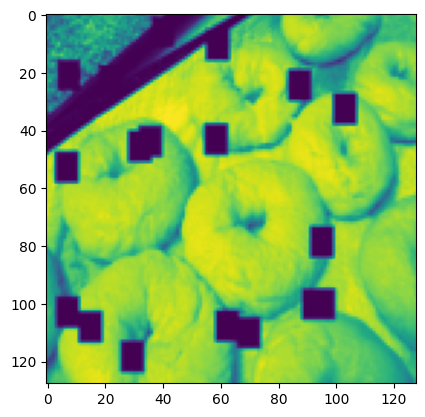

torch.Size([3, 128, 128])


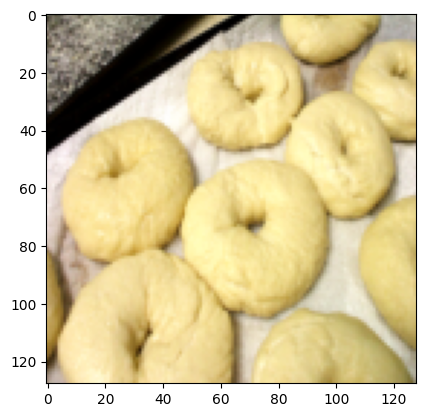

In [161]:
import matplotlib.pyplot as plt

t= dataset[907]
print(t[0].shape)
img = np.transpose((t[0].cpu().detach().numpy()*255).astype(np.uint8),(1,2,0))
plt.imshow(img)
plt.show()
print(t[1].shape)
img = np.transpose((t[1].cpu().detach().numpy()*255).astype(np.uint8),(1,2,0))
plt.imshow(img)
plt.show()

In [76]:
import torch.nn as nn
from torchvision.models import vgg16_bn
import torch

#Define encoder and decoder components for model definition

def conv(in_channels, out_channels):
    return nn.Sequential(
        nn.Conv2d(in_channels, out_channels, kernel_size=3, stride=1, padding=1),
        nn.BatchNorm2d(out_channels),
        nn.ReLU(inplace=True)
    )

def up_conv(in_channels, out_channels):
    return nn.Sequential(
        nn.ConvTranspose2d(in_channels, out_channels, kernel_size=2, stride=2),
        nn.ReLU(inplace=True)
    )


class SelfAttention(nn.Module):
    def __init__(self, dim, num_heads=4):
        super(SelfAttention, self).__init__()
        self.attention = nn.MultiheadAttention(embed_dim=dim, num_heads=num_heads, batch_first=True)
        self.norm = nn.LayerNorm(dim)
    
    def forward(self, x):
        # Reshape for attention: (B, C, H, W) -> (B, H*W, C)
        B, C, H, W = x.shape
        x = x.view(B, C, -1).permute(0, 2, 1)
        
        # Apply self-attention
        attn_out, _ = self.attention(x, x, x)
        
        # Residual connection and layer norm
        x = self.norm(x + attn_out)
        
        # Reshape back: (B, H*W, C) -> (B, C, H, W)
        x = x.permute(0, 2, 1).view(B, C, H, W)
        return x


class encoder(nn.Module):
    def __init__(self, pretrained=True, inChannel=3):
        super().__init__()

        vgg16 = vgg16_bn(pretrained=pretrained).features
        if(inChannel==1):
            vgg16[0]=nn.Conv2d(1, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        self.block1 = nn.Sequential(vgg16[:6])
        self.block2 = nn.Sequential(vgg16[6:13])
        self.block3 = nn.Sequential(vgg16[13:20])
        self.block4 = nn.Sequential(vgg16[20:27])
        self.block5 = nn.Sequential(vgg16[27:34])
        
        
    def forward(self, x):
        block1 = self.block1(x)
        block2 = self.block2(block1)
        block3 = self.block3(block2)
        block4 = self.block4(block3)
        block5 = self.block5(block4)
        
        return [block1, block2, block3, block4, block5]
    

class decoder(nn.Module):
    def __init__(self, out_channels=3):
        super().__init__()
        
        self.up_conv6 = up_conv(1024, 512)
        self.conv6 = conv(512 + 512, 512)
        self.attn6 = SelfAttention(dim=512)
        
        self.up_conv7 = up_conv(512, 256)
        self.conv7 = conv(256 + 512, 256)
        self.attn7 = SelfAttention(dim=256)
        
        self.up_conv8 = up_conv(256, 128)
        self.conv8 = conv(128 + 256, 128)
        self.attn8 = SelfAttention(dim=128)
        
        self.up_conv9 = up_conv(128, 64)
        self.conv9 = conv(64 + 128, 64)
        # self.attn9 = SelfAttention(dim=64)
        
        self.up_conv10 = up_conv(64, 32)
        self.conv10 = conv(32 + 64, 32)
        # self.attn10 = SelfAttention(dim=32)
        
        self.conv11 = nn.Conv2d(32, out_channels, kernel_size=1)
        
    def forward(self, x, residuals):  
        x = self.up_conv6(x)
        x = torch.cat([x, residuals[4]], dim=1)
        x = self.conv6(x)
        x = self.attn6(x)
        
        x = self.up_conv7(x)
        x = torch.cat([x, residuals[3]], dim=1)
        x = self.conv7(x)
        x = self.attn7(x)
        
        x = self.up_conv8(x)
        x = torch.cat([x, residuals[2]], dim=1)
        x = self.conv8(x)
        x = self.attn8(x)
        
        x = self.up_conv9(x)
        x = torch.cat([x, residuals[1]], dim=1)
        x = self.conv9(x)
        # x = self.attn9(x)
        
        x = self.up_conv10(x)
        x = torch.cat([x, residuals[0]], dim=1)
        x = self.conv10(x)
        # x = self.attn10(x)
        
        x = self.conv11(x)
        return x


class UNet(nn.Module):
    def __init__(self, pretrained=True, in_channels=1, out_channels=3):
        super().__init__()
        
        #defining the encoder which is nothing but the encoder of the vgg16 model
        self.encoder = encoder(pretrained=pretrained, inChannel=in_channels)
        #defining the bottleneck
        self.bottleneck = nn.Sequential(*vgg16_bn(pretrained=pretrained).features[34:])
        self.conv_bottleneck = conv(512, 1024)
        #defining segmentation decoder
        self.decoder = decoder(out_channels=out_channels)
        #defining reconstruction decoder
        self.relu = nn.ReLU(inplace=True)
    
    def forward(self, x, path=0):
        
        #passing through the encoder
        residuals=self.encoder(x)
        #passing through the bottleneck
        bottleneck = self.bottleneck(residuals[-1])
        x = self.conv_bottleneck(bottleneck)
        
        #height predictions
        preds = self.decoder(x,residuals)
        preds = self.relu(preds)
        return preds     


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from tqdm import tqdm
from torchvision.models import vgg16_bn

# Define Discriminator for Adversarial Training
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.features = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=3, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 256, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(256, 512, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(512, 512, kernel_size=3, stride=1, padding=0),
            nn.LeakyReLU(0.2, inplace=True)
        )

        # Flatten and add a fully connected layer
        self.fc = nn.Sequential(
            nn.Linear(512 * 6 * 6, 1024),  # Adjust input size if final feature map size changes
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(1024, 1),
            nn.Sigmoid()
        )

    def forward(self, x):
        x = self.features(x)       # Convolutional feature extraction
#         print(x.shape)
        x = x.view(x.size(0), -1)  # Flatten
#         print(x.shape)
        x = self.fc(x)             # Fully connected layer for final classification
        return x





# class SelfAttention(nn.Module):
#     def __init__(self, dim, num_heads=4):
#         super(SelfAttention, self).__init__()
#         self.attention = nn.MultiheadAttention(embed_dim=dim, num_heads=num_heads, batch_first=True)
#         self.norm = nn.LayerNorm(dim)
    
#     def forward(self, x):
#         B, C, H, W = x.shape
#         x = x.view(B, C, -1).permute(0, 2, 1)
#         attn_out, _ = self.attention(x, x, x)
#         x = self.norm(x + attn_out)
#         x = x.permute(0, 2, 1).view(B, C, H, W)
#         return x


# class Discriminator(nn.Module):
#     def __init__(self):
#         super(Discriminator, self).__init__()
#         self.conv1 = nn.Sequential(
#             nn.Conv2d(3, 64, kernel_size=3, stride=2, padding=1),
#             nn.LeakyReLU(0.2, inplace=True)
#         )
#         self.attn1 = SelfAttention(dim=64)

#         self.conv2 = nn.Sequential(
#             nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=1),
#             nn.BatchNorm2d(128),
#             nn.LeakyReLU(0.2, inplace=True)
#         )
#         self.attn2 = SelfAttention(dim=128)

#         self.conv3 = nn.Sequential(
#             nn.Conv2d(128, 256, kernel_size=3, stride=2, padding=1),
#             nn.BatchNorm2d(256),
#             nn.LeakyReLU(0.2, inplace=True)
#         )
#         self.attn3 = SelfAttention(dim=256)

#         self.conv4 = nn.Sequential(
#             nn.Conv2d(256, 512, kernel_size=3, stride=2, padding=1),
#             nn.BatchNorm2d(512),
#             nn.LeakyReLU(0.2, inplace=True)
#         )
#         self.attn4 = SelfAttention(dim=512)

#         self.conv5 = nn.Sequential(
#             nn.Conv2d(512, 512, kernel_size=3, stride=1, padding=0),
#             nn.LeakyReLU(0.2, inplace=True)
#         )

#         self.fc = nn.Sequential(
#             nn.Linear(512 * 6 * 6, 1024),
#             nn.LeakyReLU(0.2, inplace=True),
#             nn.Linear(1024, 1),
#             nn.Sigmoid()
#         )

#     def forward(self, x):
#         x = self.conv1(x)
#         # x = self.attn1(x)

#         x = self.conv2(x)
#         x = self.attn2(x)

#         x = self.conv3(x)
#         x = self.attn3(x)

#         x = self.conv4(x)
#         x = self.attn4(x)

#         x = self.conv5(x)
        
#         x = x.reshape(x.size(0), -1)  # Flatten
#         x = self.fc(x)
#         return x

# Initialize the Generator and Discriminator
model = UNet(in_channels=1, out_channels=3)
discriminator = Discriminator()

if torch.cuda.device_count() > 1:
    print(f"Using {torch.cuda.device_count()} GPUs.")
    model = nn.DataParallel(model)
    discriminator = nn.DataParallel(discriminator)

model.to(device)
discriminator.to(device)

# Losses
perceptual_criterion = Perceptual_L1_Loss()
# perceptual_criterion = nn.MSELoss()
adversarial_criterion = nn.BCELoss()

# Optimizers
optimizer_G = optim.Adam(model.parameters(), lr=0.0001)
optimizer_D = optim.Adam(discriminator.parameters(), lr=0.0001)

# Training loop with Adversarial Training


def trainDiscriminator():
    running_loss_D = 0.0
    for i, (grayImage, targetImage) in tqdm(enumerate(train_loader), total=len(train_loader)):
        grayImage = grayImage.to(device)
        targetImage = targetImage.to(device)
        
        # ---------------------------
        # Train Discriminator
        # ---------------------------
        # Real images labeled as 1
        real_labels = torch.ones(targetImage.size(0), 1, requires_grad=False).to(device)
        fake_labels = torch.zeros(targetImage.size(0), 1, requires_grad=False).to(device)
        
        # Compute discriminator loss on real images
        outputs = discriminator(targetImage)
        d_loss_real = adversarial_criterion(outputs, real_labels)
        
        # Compute discriminator loss on fake images
        fake_images = model(grayImage).detach()  # Detach to avoid training the generator here
        outputs = discriminator(fake_images)
        d_loss_fake = adversarial_criterion(outputs, fake_labels)
        
        # Backprop and optimize the discriminator
        d_loss = d_loss_real + d_loss_fake
        optimizer_D.zero_grad()
        d_loss.backward()
        optimizer_D.step()
        
        running_loss_D += d_loss.item()
        if i % 200 == 0:
            print(f"Taining Discriminator:\nDiscriminator Loss: {running_loss_D / 200}")
            running_loss_D=0.0

            
def trainGenerator():
    running_loss_D = 0.0
    running_loss_G = 0.0
    for i, (grayImage, targetImage) in tqdm(enumerate(train_loader), total=len(train_loader)):
        grayImage = grayImage.to(device)
        targetImage = targetImage.to(device)
        
        # Real images labeled as 1
        real_labels = torch.ones(targetImage.size(0), 1, requires_grad=False).to(device)
        fake_images = model(grayImage)

        # Perceptual + L1 loss
        perceptual_loss, l1_loss, perceptual_component = perceptual_criterion(fake_images, targetImage)
#         perceptual_loss = perceptual_criterion(fake_images, targetImage)

        # Adversarial loss for generator
        g_fake_output = discriminator(fake_images)
        g_adversarial_loss = adversarial_criterion(g_fake_output, real_labels)

        # Total generator loss
        g_loss = perceptual_loss + 0.01 * g_adversarial_loss  # Weighted sum of perceptual and adversarial loss

        # Backprop and optimize the generator
        optimizer_G.zero_grad()
        g_loss.backward()
        optimizer_G.step()

        running_loss_G += g_loss.item()
        
        if i % 200 == 0:
            print(f"Taining Generator:\nGenerator Loss: {running_loss_G / 200}")
            running_loss_G=0.0
            
def train():
    Adverserial_loss = 0.0
    running_loss_G = 0.0
    disciminator_loss = 0.0
    for i, (grayImage, targetImage) in tqdm(enumerate(train_loader), total=len(train_loader)):
        grayImage = grayImage.to(device)
        targetImage = targetImage.to(device)
        
        # Real images labeled as 1
        real_labels = torch.ones(targetImage.size(0), 1, requires_grad=False).to(device)
        fake_labels = torch.zeros(targetImage.size(0), 1, requires_grad=False).to(device)
        
        # Compute discriminator loss on real images
#         outputs = discriminator(targetImage[:,1:,:,:])
        outputs = discriminator(targetImage)
        d_loss_real = adversarial_criterion(outputs, real_labels)
        
        # Compute discriminator loss on fake images
        fake_images = model(grayImage).detach()  # Detach to avoid training the generator here
#         outputs = discriminator(fake_images[:,1:,:,:])
        outputs = discriminator(fake_images)
        d_loss_fake = adversarial_criterion(outputs, fake_labels)
        
        # combined discriminator loss
        d_loss = d_loss_real + d_loss_fake
        optimizer_D.zero_grad()
        d_loss.backward()
        optimizer_D.step()
        
        # ---------------------------
        # Train Generator 
        # ---------------------------
        fake_images = model(grayImage)

        # Perceptual + L1 loss
        perceptual_L1_loss, l1_loss, perceptual_loss = perceptual_criterion(fake_images, targetImage)
#         perceptual_loss = perceptual_criterion(fake_images, targetImage)
        # Adversarial loss for generator
#         g_fake_output = discriminator(fake_images[:,1:,:,:])
        g_fake_output = discriminator(fake_images)
        g_adversarial_loss = adversarial_criterion(g_fake_output, real_labels)

        # Total generator loss
        g_loss = perceptual_loss + 0.01 * g_adversarial_loss  # Weighted sum of perceptual and adversarial loss

        # Backprop and optimize the generator
        optimizer_G.zero_grad()
        g_loss.backward()
        optimizer_G.step()

        running_loss_G += g_loss.item()
        Adverserial_loss += g_adversarial_loss.item()
        disciminator_loss += d_loss.item()
        
        if i % 200 == 0:
            print(f":\nAdverserial Loss: {Adverserial_loss / 200}\nGenerator Loss: {running_loss_G / 200}\nDisciminator Loss: {disciminator_loss/200}")
            running_loss_G=0.0
            Adverserial_loss=0.0
            disciminator_loss=0.0




Using 2 GPUs.


In [ ]:
model = torch.load('/kaggle/input/colorize-grayscale/pytorch/default/1/generator.pth')
# discriminator = torch.load('/kaggle/input/colorize-grayscale/pytorch/default/1/discriminator.pth')

# Initial setup
EPOCHS = 40
model.train()
discriminator.train()
for epoch in range(EPOCHS):
#     trainDiscriminator()
#     trainGenerator()
    train()

/tmp/ipykernel_2105/421025441.py:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load('/kaggle/input/colorize-grayscale/pytorch/default/1/generator.pth')
  0%

:
Adverserial Loss: 0.029284403324127198
Generator Loss: 0.0007624705880880356
Disciminator Loss: 0.0005210138112306594


 12%|█▏        | 201/1738 [01:11<08:50,  2.90it/s]

:
Adverserial Loss: 6.368011991381645
Generator Loss: 0.11654415152966976
Disciminator Loss: 0.16657614397438011


 13%|█▎        | 226/1738 [01:20<08:44,  2.88it/s]

In [45]:
torch.save(model, 'generator.pth')
torch.save(discriminator, 'discriminator.pth')
torch.save( optimizer_D, 'discriminatorOptimizer.pth')
torch.save( optimizer_G, 'generatorOptimizer.pth')

In [72]:
model = torch.load('/kaggle/input/colorize-grayscale/pytorch/default/1/generator.pth')
# discriminator = torch.load('/kaggle/input/colorize-grayscale/pytorch/default/1/discriminator.pth')
# optimizer_D = torch.load('/kaggle/input/colorize-grayscale/pytorch/default/1/discriminatorOptimizer.pth')
# optimizer_G = torch.load('/kaggle/input/colorize-grayscale/pytorch/default/1/generatorOptimizer.pth')

/tmp/ipykernel_2105/2694375595.py:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load('/kaggle/input/colorize-grayscale/pytorch/default/1/generator.pth')


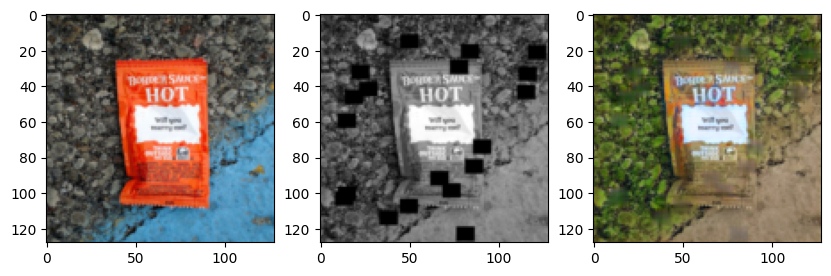

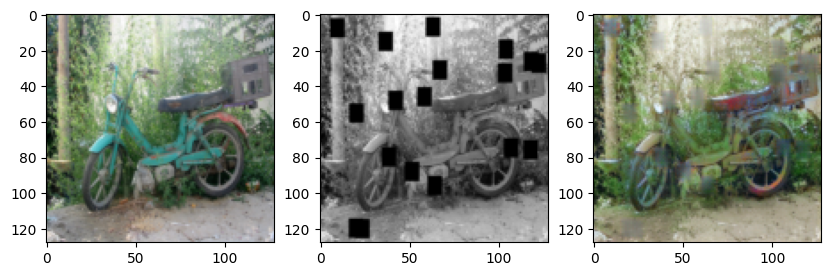

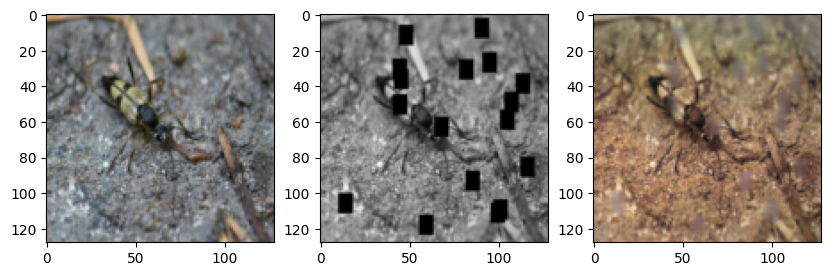

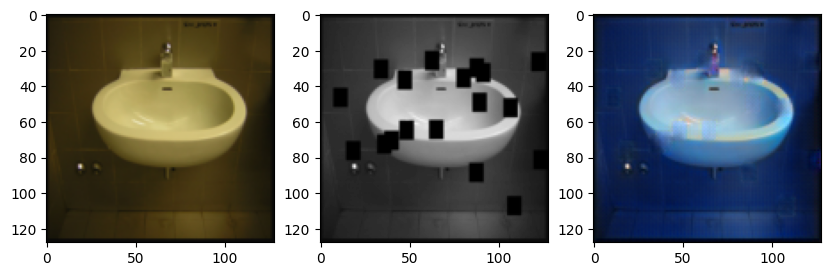

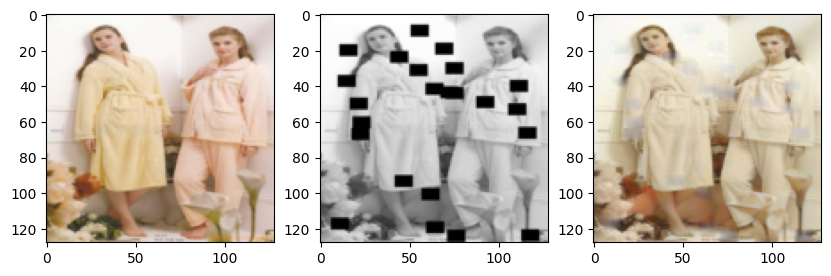

...

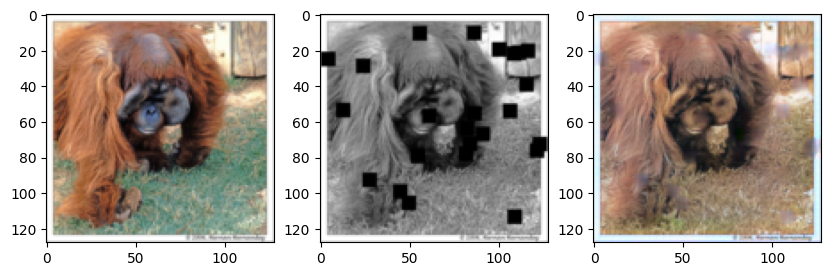

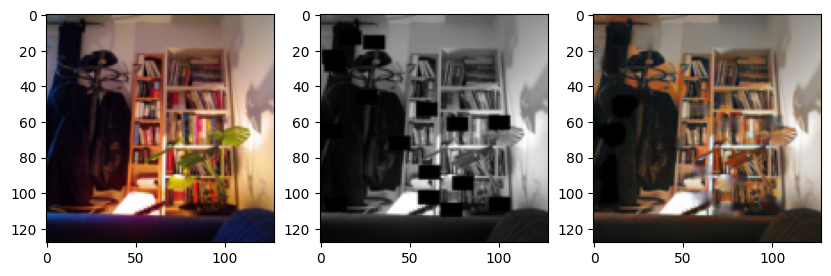

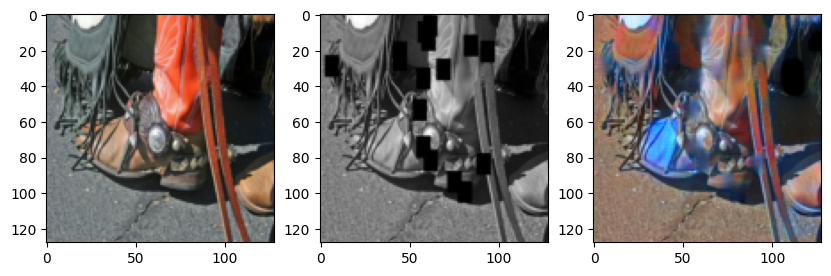

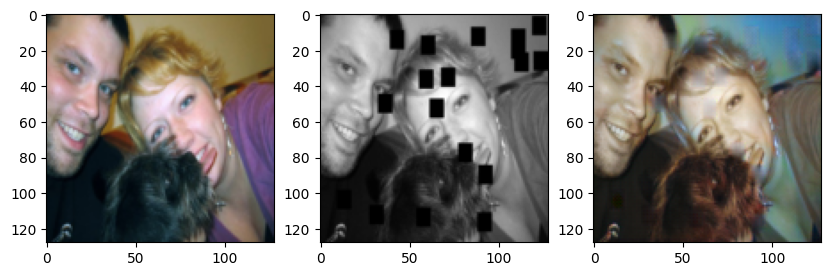

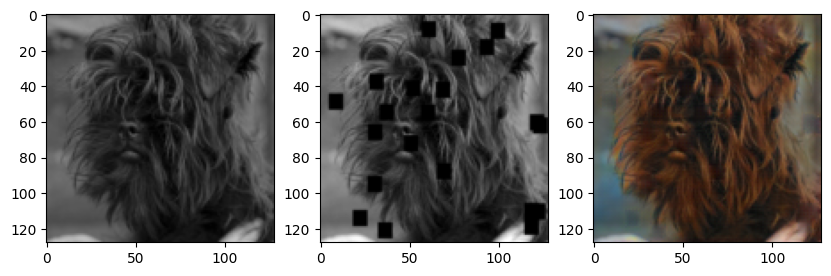

KeyboardInterrupt: 

In [ ]:
import matplotlib.pyplot as plt
model.eval()
for i, (grayImage, coloredImg) in enumerate(val_loader):
    fig, axs = plt.subplots(1, 3, figsize=(10, 5)) 
    grayImage = grayImage.to(device)
    axs[0].imshow(np.transpose(coloredImg[0].cpu().detach().numpy(), (1,2,0)))
    axs[1].imshow(np.transpose(grayImage[0].cpu().detach().numpy(), (1,2,0)), cmap='gray')
    # Forward pass
    outputs_ab = model(grayImage)
#     img = np.transpose(outputs_ab[0].cpu().detach().numpy(),(1,2,0))
#     axs[2].imshow(img)
    img = np.transpose(outputs_ab[0].cpu().detach().numpy(),(1,2,0))
    plt.imshow(img)
    plt.show()